In [14]:
import pandas as pd

In [15]:
data = pd.read_csv("/Users/ainc/Documents/Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv",
                   parse_dates=['Date'])

In [16]:
data.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,150060275,NON-CRIMINAL,LOST PROPERTY,Monday,2015-01-19,14:00,MISSION,NONE,18TH ST / VALENCIA ST,-122.421582,37.761701,"(37.7617007179518, -122.42158168137)",15006027571000
1,150098210,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821003074
2,150098210,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821004014
3,150098210,SECONDARY CODES,DOMESTIC VIOLENCE,Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821015200
4,150098226,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Tuesday,2015-01-27,19:00,NORTHERN,NONE,LOMBARD ST / LAGUNA ST,-122.431119,37.800469,"(37.8004687042875, -122.431118543788)",15009822628160


### Columns of the dataset

In [17]:
data.columns.values

array(['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time',
       'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location',
       'PdId'], dtype=object)

### Total number of incidents in the dataset

In [18]:
data['IncidntNum'].nunique()

1746914

### Use pandas to list and then count all the different categories of crime in the dataset. How many are there?

In [19]:
print(data['Category'].nunique())
print(data['Category'].unique())

39
['NON-CRIMINAL' 'ROBBERY' 'ASSAULT' 'SECONDARY CODES' 'VANDALISM'
 'BURGLARY' 'LARCENY/THEFT' 'DRUG/NARCOTIC' 'WARRANTS' 'VEHICLE THEFT'
 'OTHER OFFENSES' 'WEAPON LAWS' 'ARSON' 'MISSING PERSON'
 'DRIVING UNDER THE INFLUENCE' 'SUSPICIOUS OCC' 'RECOVERED VEHICLE'
 'DRUNKENNESS' 'TRESPASS' 'FRAUD' 'DISORDERLY CONDUCT'
 'SEX OFFENSES, FORCIBLE' 'FORGERY/COUNTERFEITING' 'KIDNAPPING'
 'EMBEZZLEMENT' 'STOLEN PROPERTY' 'LIQUOR LAWS' 'FAMILY OFFENSES'
 'LOITERING' 'BAD CHECKS' 'TREA' 'GAMBLING' 'RUNAWAY' 'BRIBERY'
 'PROSTITUTION' 'PORNOGRAPHY/OBSCENE MAT' 'SEX OFFENSES, NON FORCIBLE'
 'SUICIDE' 'EXTORTION']


### Now count the number of occurrences of each category in the dataset. What is the most commonly occurring category of crime? What is the least frequently occurring?

In [20]:
data['Category'].value_counts()

LARCENY/THEFT                  480448
OTHER OFFENSES                 309358
NON-CRIMINAL                   238323
ASSAULT                        194694
VEHICLE THEFT                  126602
DRUG/NARCOTIC                  119628
VANDALISM                      116059
WARRANTS                       101379
BURGLARY                        91543
SUSPICIOUS OCC                  80444
MISSING PERSON                  64961
ROBBERY                         55867
FRAUD                           41542
SECONDARY CODES                 25831
FORGERY/COUNTERFEITING          23050
WEAPON LAWS                     22234
TRESPASS                        19449
PROSTITUTION                    16701
STOLEN PROPERTY                 11891
SEX OFFENSES, FORCIBLE          11742
DISORDERLY CONDUCT              10040
DRUNKENNESS                      9826
RECOVERED VEHICLE                8716
DRIVING UNDER THE INFLUENCE      5672
KIDNAPPING                       5346
RUNAWAY                          4440
LIQUOR LAWS 

In [21]:
f"Most occurring: {data['Category'].value_counts().idxmax()}"

'Most occurring: LARCENY/THEFT'

In [22]:
f"Least occurring: {data['Category'].value_counts().idxmin()}"

'Least occurring: TREA'

### Create a histogram over crime occurrences

In [23]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,3)
values = data['Category'].value_counts().sort_values(0, ascending = False)
ax = plt.bar(values.index, values.values)
plt.xticks(rotation=90)
plt.show()

<Figure size 2000x300 with 1 Axes>

### To start off easily, let's count the number of crimes per year for the years 2003-2017 (since we don't have full data for 2018). What's the average number of crimes per year?

In [24]:
data.groupby(data.Date.dt.year)['IncidntNum'].count()

Date
2003    149176
2004    148148
2005    142186
2006    137853
2007    137639
2008    141311
2009    139860
2010    133523
2011    132697
2012    140847
2013    152806
2014    150128
2015    156526
2016    150883
2017    154773
2018     46668
Name: IncidntNum, dtype: int64

In [25]:
data.groupby(data.Date.dt.year)['IncidntNum'].count().mean()

138439.0

### Now create bar-charts displaying the year-by-year development of each of these categories across the years 2003-2017.

In [26]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

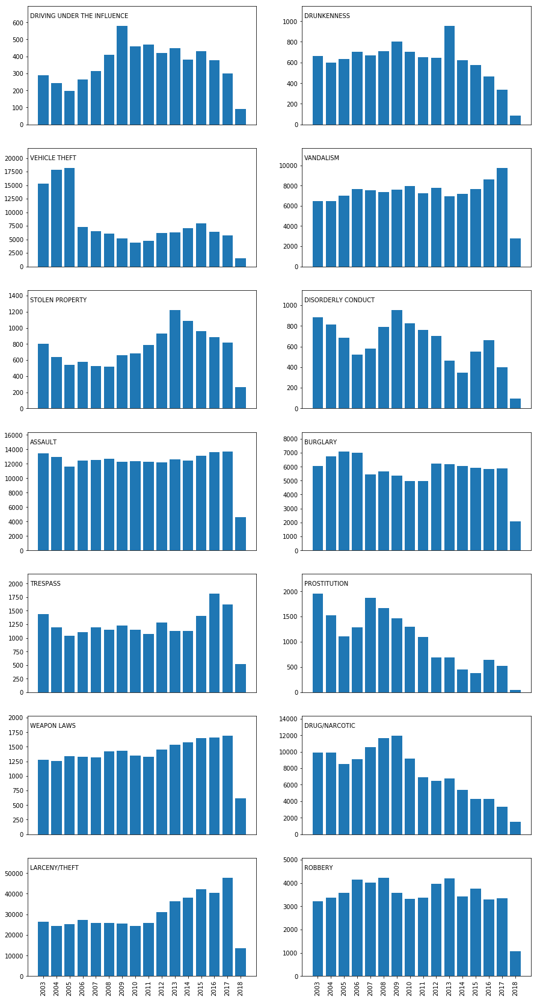

In [27]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(15, 60))
pos = np.arange(len(focuscrimes))

for i, category in enumerate(focuscrimes):
    ax = plt.subplot(len(focuscrimes), 2, i + 1)
    ax.text(.01, .9, category, transform=ax.transAxes)
    
    values = data[data['Category']==category].groupby(data.Date.dt.year)['IncidntNum'].count()
    ax.bar(list(map(lambda index: str(index), values.index)), values.values, align='center')
    ax.margins(y=0.2)
    
    if (i is (len(focuscrimes) - 1)) or (i is (len(focuscrimes)-2)):
        plt.xticks(rotation=90)
    else:
        plt.xticks([])

plt.show()

([<matplotlib.axis.XTick at 0x11aa8cb70>,
 <a list of 4 Text xticklabel objects>)

<Figure size 1080x4320 with 0 Axes>

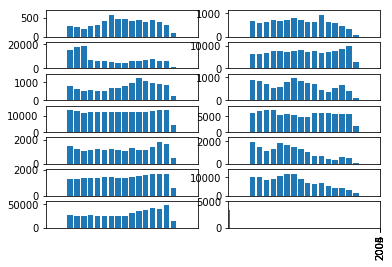

In [28]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(15, 60))
pos = np.arange(2013,2017)

cols = 2
f, axes = plt.subplots(int(len(focuscrimes)/cols), cols, sharex=True)

row = 0
col = 0
for category in focuscrimes:
    if(col >= cols):
        row+=1
        col=0
        
    #axes[row][col].set_title(category, transform=ax.transAxes)  
    values = data[data['Category']==category].groupby(data.Date.dt.year)['IncidntNum'].count()
    axes[row][col].bar(list(map(lambda index: str(index), values.index)), values.values, align='center')
    axes[row][col].margins(0.2)
    
    col += 1
plt.xticks(pos, values.index, rotation=90)

### So now we'll be combining information about PdDistrict and Category to explore differences between SF's >neighborhoods. First, simply list the names of SF's 10 police districts.

In [29]:
crimes = data['Category'].unique()

In [30]:
districts = data.ffill()['PdDistrict'].unique()

### Which has the most crimes? Which has the most focus crimes?

In [31]:
data.groupby('PdDistrict')['IncidntNum'].count().idxmax()

'SOUTHERN'

In [32]:
data[data['Category'].isin(focuscrimes)].groupby('PdDistrict')['IncidntNum'].count().idxmax()

'SOUTHERN'

### First, we need to calculate the relative probabilities of seeing each type of crime in the dataset as a whole. > That's simply a normalized version of this plot. Let's call it P(crime)

In [33]:
p_crime = data.groupby('Category')['IncidntNum'].count().divide(data['IncidntNum'].nunique())

### Next, we calculate that same probability distribution but for each PD district, let's call that P(crime|district)

In [34]:
p_crime_district = {}
for district in districts:
    p_crime_district[district] = {}

In [35]:
for district in districts:
    district_data = data[data['PdDistrict'] == district]
    p_crime_district[district] = district_data.groupby('Category')['IncidntNum'].count().divide(district_data['IncidntNum'].nunique())

### Now we look at the ratio P(crime|district)/P(crime). That ratio is equal to 1 if the crime occurs at the same level within a district as in the city as a whole. If it's greater than one, it means that the crime occurs more frequently within that district. If it's smaller than one, it means that the crime is rarer within the district in question than in the city as a whole.

In [36]:
p_crime_district_crime = {}
for district in districts:
    p_crime_district_crime[district] = p_crime_district[district].divide(p_crime)

In [37]:
array = p_crime_district_crime['MISSION']
array[focuscrimes]

Category
DRIVING UNDER THE INFLUENCE    1.223342
DRUNKENNESS                    1.401469
VEHICLE THEFT                  1.044001
VANDALISM                      0.923082
STOLEN PROPERTY                1.016374
DISORDERLY CONDUCT             1.982968
ASSAULT                        1.127579
BURGLARY                       0.801962
TRESPASS                       1.176161
PROSTITUTION                   3.388150
WEAPON LAWS                    1.216085
DRUG/NARCOTIC                  1.227052
LARCENY/THEFT                  0.777030
ROBBERY                        1.209810
Name: IncidntNum, dtype: float64

### For each district plot these ratios for the 14 focus crimes. My plot looks like this

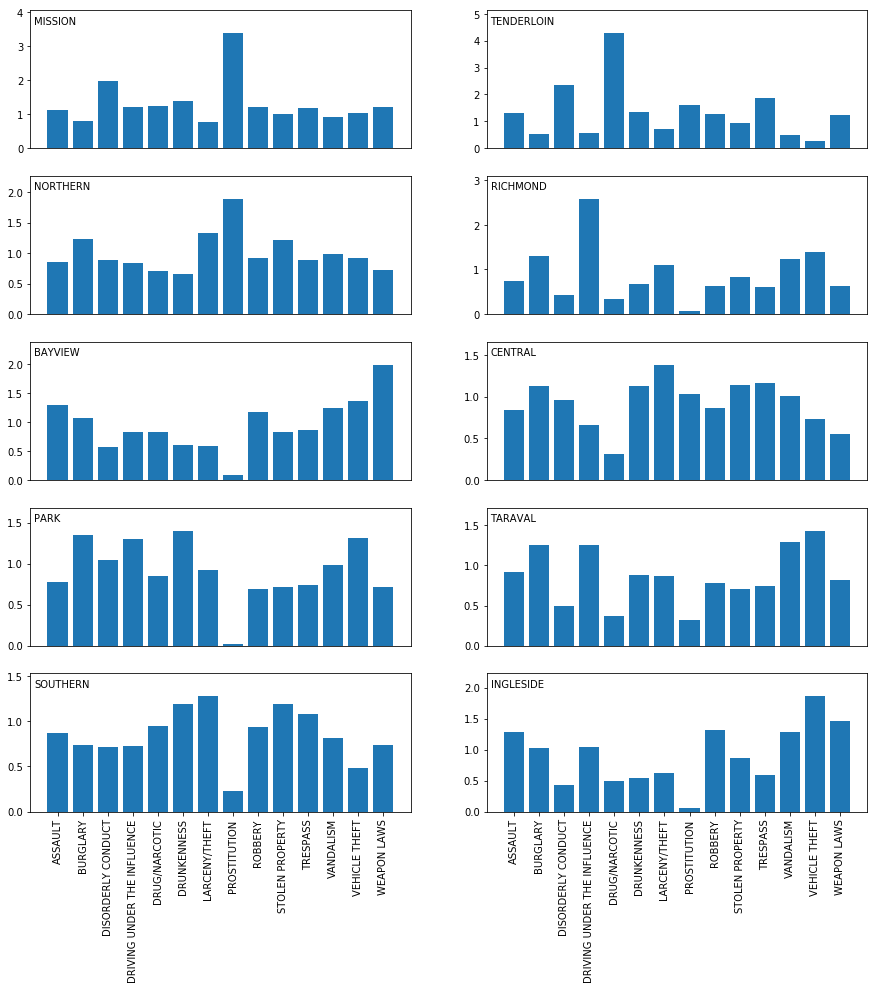

In [38]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(15, 30))
pos = np.arange(len(districts))

for i, district in enumerate(districts):
    ax = plt.subplot(len(districts), 2, i + 1)
    ax.text(.01, .9, district, transform=ax.transAxes)
    
    values = p_crime_district_crime[district][focuscrimes].sort_index()
    ax.bar(values.index, values.values, align='center')
    ax.margins(y=0.2)
    
    if (i is (len(districts) - 1)) or (i is (len(districts)-2)):
        plt.xticks(rotation=90)
    else:
        plt.xticks([])

plt.show()

In [39]:
districts

array(['MISSION', 'TENDERLOIN', 'NORTHERN', 'RICHMOND', 'BAYVIEW',
       'CENTRAL', 'PARK', 'TARAVAL', 'SOUTHERN', 'INGLESIDE'],
      dtype=object)

### First start by plotting a map of San Francisco with a nice tight zoom. Simply use the command folium.Map([lat, lon], zoom_start=13), where you'll have to look up San Francisco's longitude and latitude

In [40]:
import folium
folium.Map([37.773972, -122.43], zoom_start=13)

### Next, use the the coordinates for SF City Hall 37.77919 -122.41914 and this other tutorial draw a circle around city hall with a nice pop-up.

In [41]:
mapo = folium.Map([37.77919, -122.41914], zoom_start=13)
fgv = folium.FeatureGroup(name="City")
fgv.add_child(folium.CircleMarker(location=[37.77919, -122.41914], radius = 8, 
    popup= "City Hall",  color = 'blue', fill_opacity=0.7))
mapo.add_child(fgv)

### Use tricks from the main tutorial to draw a little circle for each arrest in the category 'DRUG/NARCOTIC' for those two months. We can call this a kind of visualization a scatter plot

In [85]:
months_crimes = data[(data['Category'] == 'DRUG/NARCOTIC') & (data['Date'].dt.year == 2017) & (data['Date'].dt.month.isin([1,2]))]

In [89]:
months_crimes

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
1838378,170062762,DRUG/NARCOTIC,POSSESSION OF METH-AMPHETAMINE,Monday,2017-01-23,14:25,SOUTHERN,"ARREST, BOOKED",500 Block of MINNA ST,-122.408771,37.780136,"(37.78013570117457, -122.40877066526002)",17006276216650
1838495,170100033,DRUG/NARCOTIC,POSSESSION OF MARIJUANA,Saturday,2017-02-04,19:08,TENDERLOIN,"ARREST, BOOKED",HYDE ST / GOLDEN GATE AV,-122.415508,37.781654,"(37.78165428060756, -122.41550824278183)",17010003316010
1838946,170104530,DRUG/NARCOTIC,POSSESSION OF METH-AMPHETAMINE,Monday,2017-02-06,12:45,SOUTHERN,"ARREST, BOOKED",800 Block of 3RD ST,-122.391425,37.777873,"(37.77787277975861, -122.39142506985705)",17010453016650
1839013,170109790,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,Wednesday,2017-02-08,11:00,NORTHERN,"ARREST, BOOKED",2300 Block of VANNESS AV,-122.423531,37.797185,"(37.797185409335235, -122.4235305474751)",17010979016710
1839387,179000458,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,Saturday,2017-01-28,20:42,TARAVAL,"ARREST, BOOKED",1600 Block of HOLLOWAY AV,-122.478278,37.720945,"(37.72094516162954, -122.47827820633243)",17900045816710
1839597,170142596,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,Sunday,2017-02-19,08:27,SOUTHERN,"ARREST, BOOKED",MINNA ST / 9TH ST,-122.414177,37.775800,"(37.775800257334076, -122.4141771617915)",17014259616710
1839673,170145023,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,Monday,2017-02-20,06:00,SOUTHERN,"ARREST, BOOKED",0 Block of 2ND ST,-122.400514,37.788656,"(37.788655888761774, -122.40051435623442)",17014502316710
1839692,170145396,DRUG/NARCOTIC,POSSESSION OF HEROIN FOR SALES,Monday,2017-02-20,10:17,TENDERLOIN,"ARREST, BOOKED",0 Block of UNITEDNATIONS PZ,-122.414318,37.779944,"(37.779944405204645, -122.41431785788087)",17014539616110
1839704,170145396,DRUG/NARCOTIC,POSSESSION OF BASE/ROCK COCAINE FOR SALE,Monday,2017-02-20,10:17,TENDERLOIN,"ARREST, BOOKED",0 Block of UNITEDNATIONS PZ,-122.414318,37.779944,"(37.779944405204645, -122.41431785788087)",17014539616623
1869468,170073656,DRUG/NARCOTIC,POSSESSION OF MARIJUANA FOR SALES,Friday,2017-01-27,03:30,INGLESIDE,"ARREST, BOOKED",4700 Block of MISSION ST,-122.436194,37.722727,"(37.72272703835756, -122.43619448489602)",17007365616030


In [112]:
m = folium.Map([37.77919, -122.41914], zoom_start=13)
for index, row in months_crimes.iterrows():
    folium.CircleMarker([row['Y'], row['X']],
                        popup=str(row['IncidntNum']),
                        radius=1,
                        color="#3db7e4", # divvy color
                       ).add_to(m)
m

In [117]:
# plot heatmap
# convert to (n, 2) nd-array format for heatmap
stationArr = months_crimes[['Y', 'X']].as_matrix()
m.add_children(plugins.HeatMap(stationArr, radius=15))
m

/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  after removing the cwd from sys.path.


### Create a heatmap of all arrests for 'DRUG/NARCOTIC' during June-July 2016. Play with parameters to get plots you like

In [118]:
drug_narcotic_jun_jul_2016 = data[(data['Category'] == 'DRUG/NARCOTIC') & (data['Date'].dt.year == 2016) & (data['Date'].dt.month.isin([6,7]))]

In [120]:
m = folium.Map([37.77919, -122.41914], zoom_start=13)
for index, row in drug_narcotic_jun_jul_2016.iterrows():
    folium.CircleMarker([row['Y'], row['X']],
                        popup=str(row['IncidntNum']),
                        radius=1,
                        color="#3db7e4", # divvy color
                       ).add_to(m)

In [121]:
# plot heatmap
# convert to (n, 2) nd-array format for heatmap
crimesArr = drug_narcotic_jun_jul_2016[['Y', 'X']].as_matrix()
m.add_children(plugins.HeatMap(crimesArr, radius=15))
m

/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  after removing the cwd from sys.path.


### Create a heatmap of all arrests for 'LARCENY/THEFT' during June-July 2016

In [123]:
theft_jun_jul_2016 = data[(data['Category'] == 'LARCENY/THEFT') & (data['Date'].dt.year == 2016) & (data['Date'].dt.month.isin([6,7]))]

In [124]:
m = folium.Map([37.77919, -122.41914], zoom_start=13)
for index, row in theft_jun_jul_2016.iterrows():
    folium.CircleMarker([row['Y'], row['X']],
                        popup=str(row['IncidntNum']),
                        radius=1,
                        color="#3db7e4", # divvy color
                       ).add_to(m)

In [131]:
theft_jun_jul_2016

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
1305,166165710,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Tuesday,2016-07-26,18:00,CENTRAL,NONE,SACRAMENTO ST / DAVIS ST,-122.397800,37.794434,"(37.794433552416066, -122.39779964144978)",16616571006244
1395,166166053,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Tuesday,2016-07-26,19:30,NORTHERN,NONE,3600 Block of LYON ST,-122.448278,37.804272,"(37.80427188789098, -122.44827840533021)",16616605306244
1760,166170048,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Saturday,2016-07-30,15:48,RICHMOND,NONE,700 Block of GREAT HY,-122.511079,37.773992,"(37.77399184296936, -122.51107911663537)",16617004806372
1806,166171472,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Wednesday,2016-07-20,16:45,SOUTHERN,NONE,700 Block of MARKET ST,-122.404095,37.787256,"(37.787256092799346, -122.40409466245012)",16617147206372
7207,166238351,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Sunday,2016-06-12,03:00,MISSION,NONE,3300 Block of 20TH ST,-122.416321,37.758742,"(37.758742463907076, -122.4163206448659)",16623835106374
1805859,166139806,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,2016-06-20,14:00,NORTHERN,NONE,BAKER ST / JEFFERSON ST,-122.447100,37.804216,"(37.80421641761859, -122.44709993644044)",16613980606244
1838709,160547718,LARCENY/THEFT,GRAND THEFT FROM A BUILDING,Wednesday,2016-07-06,19:00,SOUTHERN,NONE,700 Block of MISSION ST,-122.403971,37.784828,"(37.784828309361046, -122.40397126905746)",16054771806304
1838711,160619981,LARCENY/THEFT,PETTY THEFT FROM A BUILDING,Sunday,2016-07-17,09:05,PARK,NONE,700 Block of STANYAN ST,-122.453190,37.767785,"(37.76778505863337, -122.4531901983405)",16061998106303
1838764,160549708,LARCENY/THEFT,PETTY THEFT BICYCLE,Sunday,2016-07-03,16:00,MISSION,NONE,CASTRO ST / 19TH ST,-122.434854,37.759289,"(37.759288789168274, -122.43485395576222)",16054970806313
1840584,160590983,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Friday,2016-07-22,14:00,INGLESIDE,NONE,400 Block of LISBON ST,-122.434148,37.721179,"(37.721179322925906, -122.4341477159309)",16059098306224


In [129]:
# plot heatmap
# convert to (n, 2) nd-array format for heatmap
crimesArr = theft_jun_jul_2016[['Y', 'X']].as_matrix()
m.add_children(plugins.HeatMap(crimesArr, radius=1))
m

/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ainc/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  after removing the cwd from sys.path.


In [130]:
crimesArr

array([[  37.79443355, -122.39779964],
       [  37.80427189, -122.44827841],
       [  37.77399184, -122.51107912],
       ...,
       [  37.78325965, -122.40271259],
       [  37.75841158, -122.43581192],
       [  37.76745989, -122.43340929]])